# Spatially aware style transfer - by Xu Mingchuan

This notebook contains three main parts of the work: content semantic segmentation, style superpixels segmentation and style transfer training.

I implemented three methods with three different algorithms of superpixels segmentation on style image. The criteria for closeness metric is Euclidean distance of vectors consisted of means and standard deviations for grayscaled content and style images. Finally, I implemented *averaging hyperparamaeter* for different levels of spatially aware style transfer.

For the final results of my work please go to the part **"THE FINAL RESULT IMAGES"**

Recommend run this notebook in Colab.

Firstly I will introduce all the elements of my work and the util functions that will be useful in the future.

In [2]:
import os
import numpy as np
import PIL

def read_from_drive(dir):
  dir_Name = "/content/drive/MyDrive/Images/" + dir
  img_list = os.listdir(dir_Name)

  list_pil_img = []
  for img in img_list:
    name = dir_Name + "/" + img
    pil_img = PIL.Image.open(name).convert('RGB')
    pil_img = pil_img.resize((512,512))
    # pil_image = np.array(pic_image)
    list_pil_img.append(pil_img)
  return list_pil_img

## CONTENT SEMANTIC SEGMENTATION

Backbond code from
https://github.com/CSAILVision/semantic-segmentation-pytorch/tree/master/notebooks

https://colab.research.google.com/github/CSAILVision/semantic-segmentation-pytorch/blob/master/notebooks/DemoSegmenter.ipynb

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Environment Setup

First, download the code and pretrained models if we are on colab.

In [3]:
%%bash
# Colab-specific setup
!(stat -t /usr/local/lib/*/dist-packages/google/colab > /dev/null 2>&1) && exit 
pip install yacs 2>&1 >> install.log
git init 2>&1 >> install.log
git remote add origin https://github.com/CSAILVision/semantic-segmentation-pytorch.git 2>> install.log
git pull origin master 2>&1 >> install.log
DOWNLOAD_ONLY=1 ./demo_test.sh 2>> install.log

From https://github.com/CSAILVision/semantic-segmentation-pytorch
 * branch            master     -> FETCH_HEAD
 * [new branch]      master     -> origin/master


### Imports and utility & Load model

We need pytorch, numpy, and the code for the segmentation model.  And some utilities for visualizing the data.

Here we load a pretrained segmentation model.  Like any pytorch model, we can call it like a function, or examine the parameters in all the layers.

After loading, we put it on the GPU.  And since we are doing inference, not training, we put the model in eval mode.

In [4]:
# System libs
import os, csv, torch, numpy, scipy.io, PIL.Image, torchvision.transforms
# Our libs
from mit_semseg.models import ModelBuilder, SegmentationModule
from mit_semseg.utils import colorEncode

colors = scipy.io.loadmat('data/color150.mat')['colors']
names = {}
with open('data/object150_info.csv') as f:
    reader = csv.reader(f)
    next(reader)
    for row in reader:
        names[int(row[0])] = row[5].split(";")[0]

def visualize_result(img, pred, index=None):
    # filter prediction class if requested
    if index is not None:
        pred = pred.copy()
        pred[pred != index] = -1
        print(f'{names[index+1]}:')
        
    # colorize prediction
    pred_color = colorEncode(pred, colors).astype(numpy.uint8)

    # aggregate images and save
    im_vis = numpy.concatenate((img, pred_color), axis=1)
    # print(img.shape, pred.shape, im_vis.shape)
    display(PIL.Image.fromarray(im_vis))


# Network Builders
net_encoder = ModelBuilder.build_encoder(
    arch='resnet50dilated',
    fc_dim=2048,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/encoder_epoch_20.pth')
net_decoder = ModelBuilder.build_decoder(
    arch='ppm_deepsup',
    fc_dim=2048,
    num_class=150,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/decoder_epoch_20.pth',
    use_softmax=True)

crit = torch.nn.NLLLoss(ignore_index=-1)
segmentation_module = SegmentationModule(net_encoder, net_decoder, crit)
segmentation_module.eval()
segmentation_module.cuda()

Loading weights for net_encoder
Loading weights for net_decoder


SegmentationModule(
  (encoder): ResnetDilated(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): SynchronizedBatchNorm2d(128, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): SynchronizedBatchNorm2d(64, eps=1

### Load test data & Run the Model 

Now we load and normalize a single test image.  Here we use the commonplace convention of normalizing the image to a scale for which the RGB values of a large photo dataset would have zero mean and unit standard deviation.  (These numbers come from the imagenet dataset.)  With this normalization, the limiiting ranges of RGB values are within about (-2.2 to +2.7).

Finally we just pass the test image to the segmentation model.

The segmentation model is coded as a function that takes a dictionary as input, because it wants to know both the input batch image data as well as the desired output segmentation resolution.  We ask for full resolution output.

Then we use the previously-defined visualize_result function to render the segmentation map.

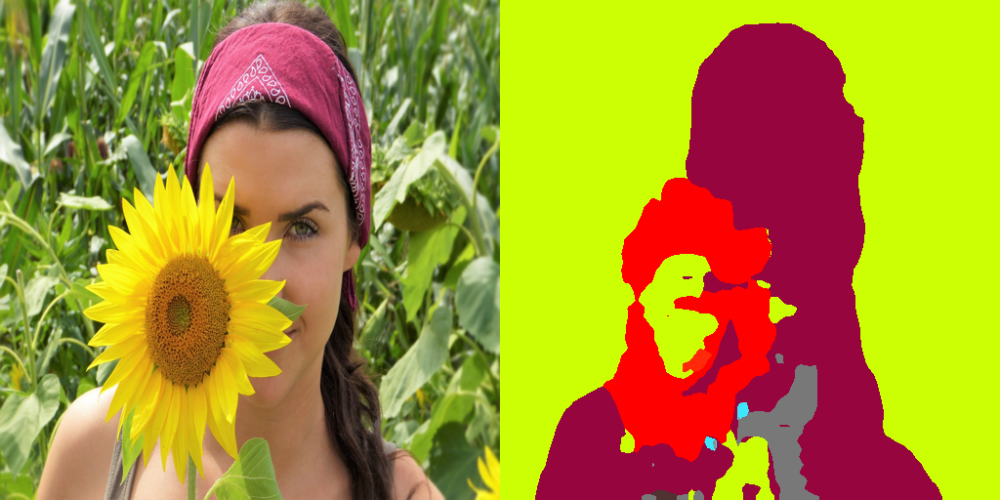

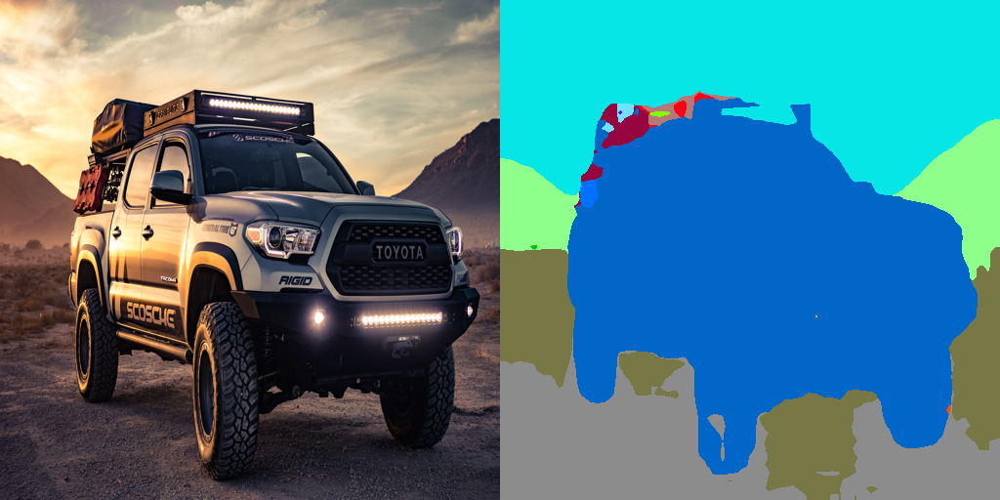

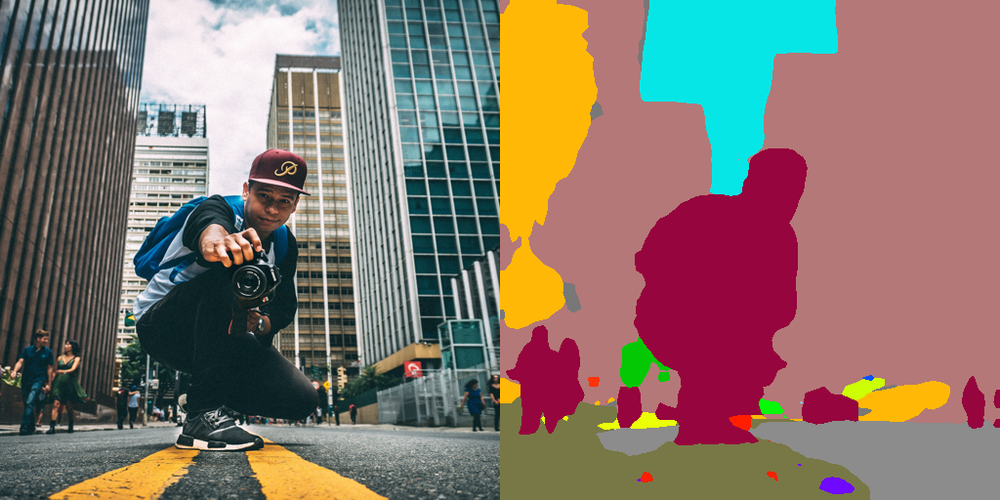

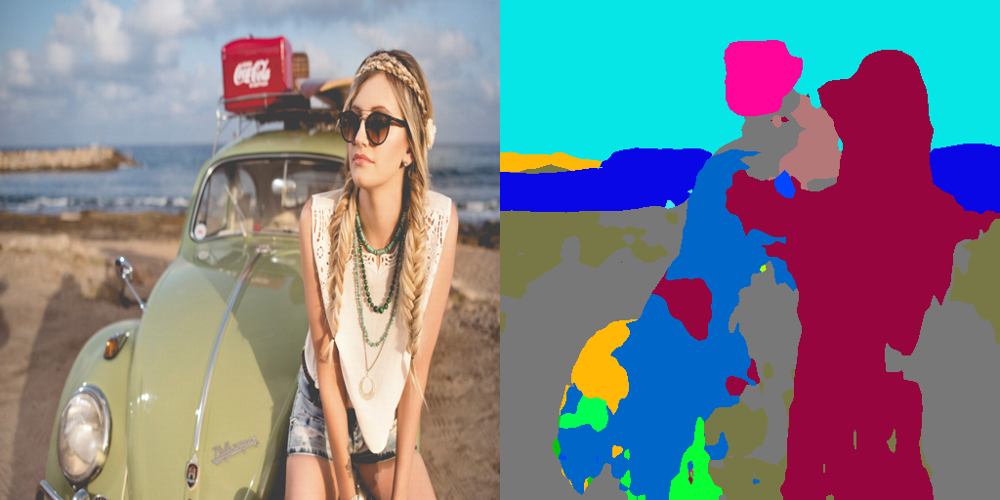

In [5]:
# Load and normalize one image as a singleton tensor batch
pil_to_tensor = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(
        mean=[0.485, 0.456, 0.406], # These are RGB mean+std values
        std=[0.229, 0.224, 0.225])  # across a large photo dataset.
])

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

pil_image_list = read_from_drive("Contents")
content_original_list = [np.array(pil_image) for pil_image in pil_image_list]
img_data_list = [pil_to_tensor(pil_image) for pil_image in content_original_list]

i = 0
pred_list = []
for img_data in img_data_list:
  singleton_batch = {'img_data': img_data[None].cuda()}
  output_size = img_data.shape[1:]

  # Run the segmentation at the highest resolution.
  with torch.no_grad():
    scores = segmentation_module(singleton_batch, segSize=output_size)
    
# Get the predicted scores for each pixel
  _, pred = torch.max(scores, dim=1)
  pred = pred.cpu()[0].numpy() # pred -> mask indicator for each pixel
  pred_list.append(pred)
  visualize_result(content_original_list[i], pred)
  i = i + 1

### Showing classes individually

To see which colors are which, here we visualize individual classes, one at a time.

In [6]:
# Top classes in answer
predicted_classes_list = []
for k in range(len(img_data_list)):
  predicted_classes = numpy.bincount(pred_list[k].flatten()).argsort()[::-1]
  predicted_classes_list.append(predicted_classes)

In [ ]:

# for c in predicted_classes[:15]: visualize_result(img_original, pred, c)

# it can be seen from the experiments that: 
# for the given four pics: about 5-10 classes in each pic are extracted.

## STYLE SUPERPIXELS SEGMENTATION

https://scikit-image.org/docs/dev/auto_examples/segmentation/plot_segmentations.html

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL.Image

from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float

# the algorithms here return indicating masks for each pixel
# (each pixel belongs to which segment)

def superpixels_segments(img, img_name):
  segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=50)
  segments_slic = slic(img, n_segments=250, compactness=10, sigma=1)
                     # start_label=1)
  segments_quick = quickshift(img, kernel_size=3, max_dist=6, ratio=0.5)
  # gradient = sobel(rgb2gray(img))
  # segments_watershed = watershed(gradient, markers=250, compactness=0.001)

  num_felzenszwalb = len(np.unique(segments_fz))
  num_slic = len(np.unique(segments_slic))
  num_quickshift = len(np.unique(segments_quick))

  print(f'{img_name} - superpixels segments')
  print(f'Felzenszwalb number of segments: {num_felzenszwalb}')
  print(f'SLIC number of segments: {num_slic}')
  print(f'Quickshift number of segments: {num_quickshift}')

  return segments_fz, segments_slic, segments_quick, num_felzenszwalb, num_slic, num_quickshift

pil_style_list = read_from_drive("Styles")
style_original_list = [np.array(pil_image) for pil_image in pil_style_list]

segments_fz_list = []
segments_slic_list = []
segments_quick_list = []
num_felzenszwalb_list = []
num_slic_list = []
num_quickshift_list = []

for i in range(len(pil_style_list)):
  segments_fz, segments_slic, segments_quick, num_felzenszwalb, num_slic, num_quickshift = superpixels_segments(style_original_list[i], pil_style_list[i])

  segments_fz_list.append(segments_fz)
  segments_slic_list.append(segments_slic)
  segments_quick_list.append(segments_quick)

  num_felzenszwalb_list.append(num_felzenszwalb)
  num_slic_list.append(num_slic)
  num_quickshift_list.append(num_quickshift)

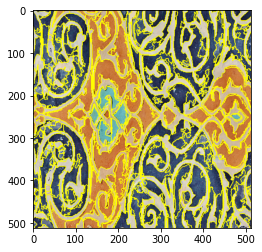

In [124]:
plt.imshow(mark_boundaries(style_original_list[0], segments_fz_list[0]))

## SEGMENTS EXTRACTION

In [8]:
alpha = 0.5 # value from 0 to 1

MAX_NUM_SEGMENTS = 10
MIN_NUM_SEGMENTS = 1

CURRENT_NUM_SEGMENTS = int(1 + alpha* (MAX_NUM_SEGMENTS - MIN_NUM_SEGMENTS))
CURRENT_NUM_SEGMENTS

5

In [9]:
def img_content_extract(img_original, pred, classes_chosen):
  img_extract = img_original.copy()
  for x in range(len(img_original)):
    for y in range(len(img_original)):
      if pred[x][y] not in classes_chosen:
        for i in range(0,3):
          img_extract[x][y][i] = 0
  return img_extract

def img_style_extract(img_original, img_segments, superpixels_chosen):
  img_extract = img_original.copy()
  for x in range(len(img_original)):
    for y in range(len(img_original)):
      if img_segments[x][y] not in superpixels_chosen:
        for i in range(0,3):
          img_extract[x][y][i] = 0
  return img_extract



### For the Content
Content segments we only take 10 top classes, since the other segments are so small

In [10]:
num_basic_parts_content = 10 # number of segments by semantic segmanetation

In [152]:
def content_segments_creating(num_segments, img_idx):
  content_segments = np.zeros((num_segments, len(content_original_list[img_idx]), len(content_original_list[img_idx]), 3))
  segment_in_every_part = int(num_basic_parts_content / CURRENT_NUM_SEGMENTS)              
  predicted_classes = predicted_classes_list[img_idx]                      
                              
  for i in range(num_segments):
    img_content_k = img_content_extract(content_original_list[img_idx], pred_list[img_idx], np.array(predicted_classes[i*segment_in_every_part: (i+1)*segment_in_every_part]))
    content_segments[i] = img_content_k
    # print(f'Img: {img_idx}, have done for {i} segments')
  
  return content_segments

Img: 2, have done for 0 segments
Img: 2, have done for 1 segments
Img: 2, have done for 2 segments
Img: 2, have done for 3 segments
Img: 2, have done for 4 segments


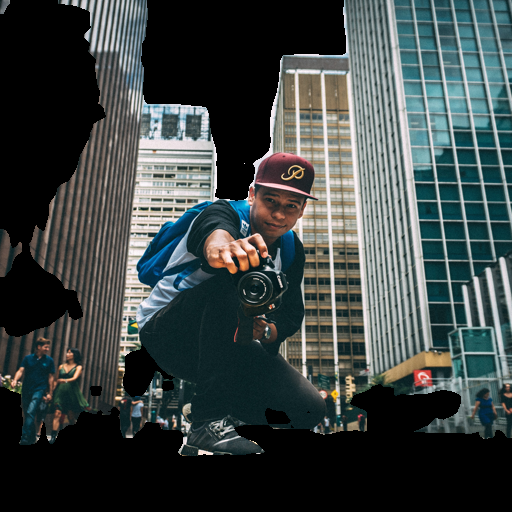

In [12]:
# Demo: 2nd part of content
content_segments = content_segments_creating(CURRENT_NUM_SEGMENTS, 2)
img_content_segment1 = PIL.Image.fromarray(np.uint8(content_segments[0])).convert('RGB')
img_content_segment1

### For the Style

In [153]:
# which img: img_idx; which method: seg_method_list, method_num_list
def style_segments_creating(num_segments, img_idx, style_method_idx):
  if style_method_idx == 0: 
    num_in_every_part = int(num_felzenszwalb_list[img_idx] / num_segments)
    seg_method_list = segments_fz_list
  if style_method_idx == 1: 
    num_in_every_part = int(num_slic_list[img_idx] / num_segments)
    seg_method_list = segments_slic_list
  if style_method_idx == 2: 
    num_in_every_part = int(num_quickshift_list[img_idx] / num_segments)
    seg_method_list = segments_quick_list

  style_superpixels = np.zeros((num_segments, len(style_original_list[img_idx]), len(style_original_list[img_idx]), 3))

  for i in range(num_segments):
    img_style_i = img_style_extract(style_original_list[img_idx], seg_method_list[img_idx], np.array(range(i*num_in_every_part, (i+1)*num_in_every_part)))
    style_superpixels[i] = img_style_i
    # if i%10 == 0:
    # print(f'Img_idx: {img_idx}, Method: {style_method_idx}, have done for {i} parts')
  
  return style_superpixels

Img_idx: 2, Method: 2, have done for 0 parts
Img_idx: 2, Method: 2, have done for 1 parts
Img_idx: 2, Method: 2, have done for 2 parts
Img_idx: 2, Method: 2, have done for 3 parts
Img_idx: 2, Method: 2, have done for 4 parts


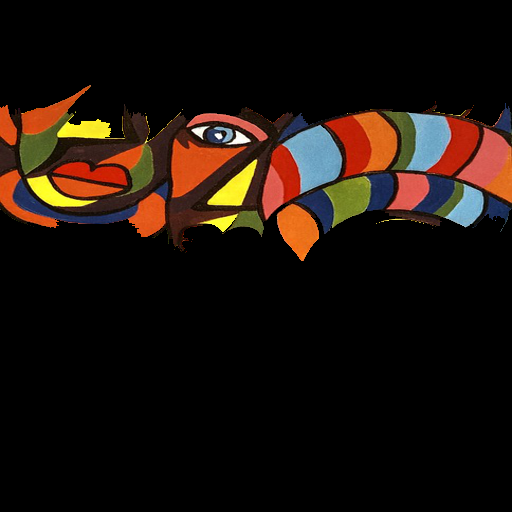

In [14]:
# Demo: the 2nd part of style
style_superpixels = style_segments_creating(CURRENT_NUM_SEGMENTS, 2, 2)
img_style_segment1 = PIL.Image.fromarray(np.uint8(style_superpixels[1])).convert('RGB')
img_style_segment1

## STYLE TRANSFER TRAINING

Backbond code from https://pytorch.org/tutorials/advanced/neural_style_tutorial.html

After extracting segments from the images, we then separately train ST on each pair segments of style and content and then add them up to a single image (with clipping operation on each image)

### Imports

In [15]:
from __future__ import print_function

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Losses functions & training functions

In [164]:
# desired size of the output image
imsize = 512 if torch.cuda.is_available() else 128  # use small size if no gpu

loader = transforms.Compose([
    transforms.Resize(imsize),  # scale imported image
    transforms.ToTensor()])  # transform it into a torch tensor

def image_loader_fromarray(img_array):
  image = PIL.Image.fromarray(np.uint8(img_array)).convert('RGB')
  image = loader(image).unsqueeze(0)
  return image.to(device, torch.float)

def image_loader(image_name):
    image = Image.open(image_name)
    image = image.resize((imsize, imsize))
    # fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        # we 'detach' the target content from the tree used
        # to dynamically compute the gradient: this is a stated value,
        # not a variable. Otherwise the forward method of the criterion
        # will throw an error.
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)

class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

# create a module to normalize input image so we can easily put it in a
# nn.Sequential
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize img
        return (img - self.mean) / self.std



# desired depth layers to compute style/content losses :
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    # normalization module
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    # just in order to have an iterable access to or list of content/syle
    # losses
    content_losses = []
    style_losses = []

    # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ContentLoss
            # and StyleLoss we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses


def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img])
    return optimizer

def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=1000000, content_weight=1):
    """Run the style transfer."""
    # print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)

    # We want to optimize the input and not the model parameters so we
    # update all the requires_grad fields accordingly
    input_img.requires_grad_(True)
    model.requires_grad_(False)

    optimizer = get_input_optimizer(input_img)

    # print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            # if run[0] % 50 == 0:
                # print("run {}:".format(run))
                # print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                 #    style_score.item(), content_score.item()))
                # print()

            return style_score + content_score

        optimizer.step(closure)

    # a last correction...
    with torch.no_grad():
        input_img.clamp_(0, 1)
    
    # print(model)

    return input_img

### Metric of closeness
closeness of grayscaled images

rgb2gray: ndarray -> ndarray

In [165]:
def img_closeness(img_1, img_2):
  stats_1 = np.array([np.mean(img_1), np.var(img_1)])
  stats_2 = np.array([np.mean(img_2), np.var(img_2)])
  metric = np.sqrt((stats_1[0] - stats_2[0])**2 + (stats_1[1] - stats_2[1])**2)
  return metric

def compare_sort_closeness(style_list, content_list):
  content_style_closeness = []
  # most_closeness_idx = -1
  style_idx_list = list(range(len(style_list)))
  for content in content_list:
    # calculate which content is closest to style
    content_gray = rgb2gray(content)
    most_closeness_idx = np.array([img_closeness(content_gray, rgb2gray(style_list[i])) for i in style_idx_list]).argmin()
    content_style_closeness.append(style_idx_list[most_closeness_idx])
    style_idx_list.pop(most_closeness_idx)
    # print(content_style_closeness, style_idx_list)
  return content_style_closeness

### Load data and training 
Training for every pair in the mapping of styles and contents

In [18]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()
# ImageNet-like norm
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

In [171]:
def train(style_idx, content_idx, style_method_idx):
  num_pairs = CURRENT_NUM_SEGMENTS
  output_array = []

  # load the images
  print('Style segmenting ......')
  style_superpixels = style_segments_creating(CURRENT_NUM_SEGMENTS, style_idx, style_method_idx)
  print('Content segmenting ......')
  content_segments = content_segments_creating(CURRENT_NUM_SEGMENTS, content_idx)
  content_style_close = compare_sort_closeness(style_superpixels, content_segments)

  print("Training ......")
  for i in range(num_pairs):
    style_img_fa = image_loader_fromarray(style_superpixels[content_style_close[i]])
    content_img_fa = image_loader_fromarray(content_segments[i])
    input_img = content_img_fa.clone()
    # train
    # print(f'Training for the {i} th pair:')
    output_i = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img_fa, style_img_fa, input_img, num_steps= 150 + i*10)
    # have seen overfitting after 200 epoches

    # output += output_i
    output_array.append(output_i)

  return output_array, content_segments

def train_baseline(content, style):
  style_img_fa = image_loader_fromarray(style)
  content_img_fa = image_loader_fromarray(content)
  input_img = content_img_fa.clone()

  output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img_fa, style_img_fa, input_img, num_steps = 150)
  return output


### Clipping & final style-tranfer image
Clip pixels which are out of the segments in the content

In [167]:
def clip_pic(img_original, segment):
  img_clip = img_original.copy()
  for x in range(len(img_original)):
    for y in range(len(img_original)):
      if not segment[x,y,:].all():
        for i in range(0,3):
          img_clip[x][y][i] = 0
  return img_clip

# Another way to map: if clipped image has many black area: take this mapping
def style_mapping(content_seg, style_seg_img):
  style_seg_list = []
  for x in range(len(content_seg)):
    for y in range(len(content_seg)):
      if content_seg[x,y,:].any():
        style_seg_list.append(style_seg_img[x][y])
  style_seg_list = list(set(style_seg_list))

  return style_seg_list

def baseline_correct(baseline_pic, output_pic):
  for x in range(len(baseline_pic)):
    for y in range(len(baseline_pic)):
      if output_pic[x,y,:].sum() < 200:
        for i in range(0,3): output_pic[x][y][i] = baseline_pic[x][y][i]
  return output_pic

In [ ]:
# style_seg_list = style_mapping(content_segments[1], segments_fz_list[3])
# img_style_extract = img_style_extract(style_original_list[3], segments_fz_list[3], style_seg_list)
# pic_img = PIL.Image.fromarray( np.uint8(np.concatenate((content_segments[1],img_style_extract), axis = 1))).convert('RGB')
# pic_img

In [172]:
def train_total(method, style, content):
  # train 
  pic_total = np.zeros((512,512,3))
  output_array, content_segments = train(style, content, style_method_idx = method)
  for i in range(CURRENT_NUM_SEGMENTS):
    pic = np.array(transforms.ToPILImage()(output_array[i].cpu().squeeze(0)))
    pic = clip_pic(pic, content_segments[i])
    pic_total = pic_total + pic

  baseline = train_baseline(style_original_list[style], content_original_list[content])
  # pic_total_img = baseline_correct(baseline, pic_total)
  pic_img = PIL.Image.fromarray(np.uint8(pic_total)).convert('RGB')

  # visualize 
  print(f'Method: {method}, style: {style}, content: {content}')
  visualize_result(content_original_list[content], pred_list[content])

  show = PIL.Image.fromarray(np.uint8(style_original_list[style])).convert('RGB')
  fig, ax = plt.subplots(1,2, figsize=(10,10),sharex=True, sharey=True)
  ax.flatten()
  ax[0].imshow(show)
  ax[1].imshow(mark_boundaries(style_original_list[style], segments_fz_list[style]))
  for a in ax.ravel():
    a.set_axis_off()

  plt.tight_layout()
  plt.show()

  baseline_img = transforms.ToPILImage()(baseline.cpu().squeeze(0))
  pic_total = PIL.Image.fromarray(np.uint8(pic_total)).convert('RGB')
  fig, ax = plt.subplots(1,2, figsize=(10,10),sharex=True, sharey=True)
  ax.flatten()
  ax[0].imshow(baseline_img)
  ax[1].imshow(pic_total)
  for a in ax.ravel():
    a.set_axis_off()

  plt.tight_layout()
  plt.show()

# THE FINAL RESULT IMAGES

## Method 1

* All of the three methods are different by segmentation methods for **style image**

* The first Method using **Felzenszwalb’s efficient graph based segmentation** for style image
* The segmentations for content image using pretrained Encoder-Decoder architechture with **resnet50dilated**
* The criteria for closeness metric is Euclidean distance of vectors consisted of means and standard deviations for grayscaled content and style images.
* The mapping: After segmentation procedure for content image, I sorted segments by its size, then I map from the largest content segment to the closest superpixels in style images by the metric criteria. (superpixels are grouped by its numbers, detail in **SEGMENTS EXTRACTION**)
* For every pair of style and image: 
  - the first row is content image and it's segmentation mask
  - the second row is style image and it's superpixels boundaries
  - the third row is the baseline uniformed style-transfer image and spatially-aware-style-transfer image.

**Some remark：** 

* The resolution might be not so high (512*512): to prevent memory-out-of-boundary
* The baseline uniformed art-image are more like style image because I put not high weights to the content image. (If I raise the weight by several times, then the baseline image would be great, but it will also affect the ultimate effect of spatially-aware image)
* It can be found that in some pairs the transfered images didn't show beautiful effect (some noise in the image), maybe I didn't finetune the best hyperparameters, but still it's clear to see the boundaries for different parts of styles. (For example,
  - in the girl(with flower) picture: the girl, flower and background are stylized with different styles;
  - in the car picture: the sky, car, ground are stylized with different styles;
  - in the boy picture: the boy, ground, buildings, sky are stylized with different styles;
  - in the girl(with car) picture: the girl, car, beach, sea, sky are stylized with different styles.

**For the sake of time-saving (because before the deadline time I found one mistake in my code, so I can not run for all of pairs at the last time :((( ), I will only represent 4 pairs of my first method**

-  1st style with 1st content
-  2nd style with 2nd content
-  3rd style with 3rd content
-  4th style with 4th content

Style segmenting ......
Content segmenting ......
Training ......


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


Method: 0, style: 0, content: 0


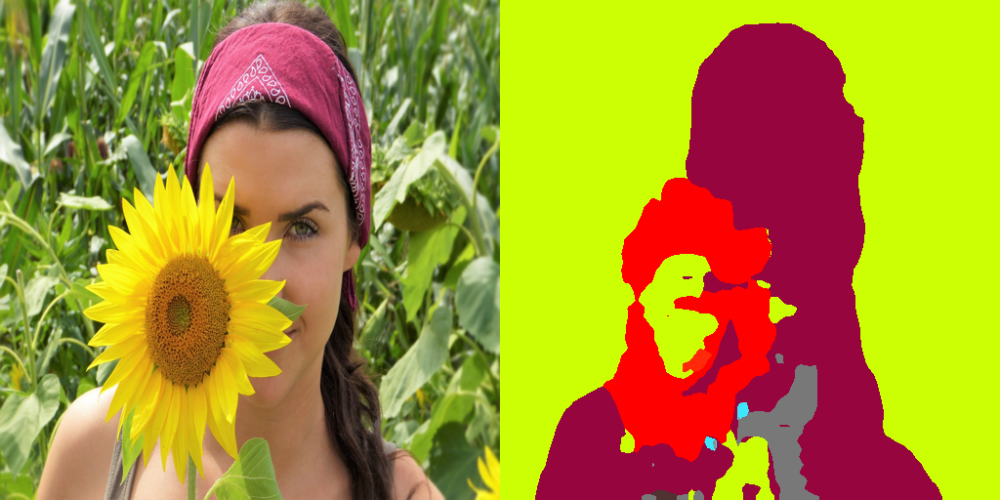

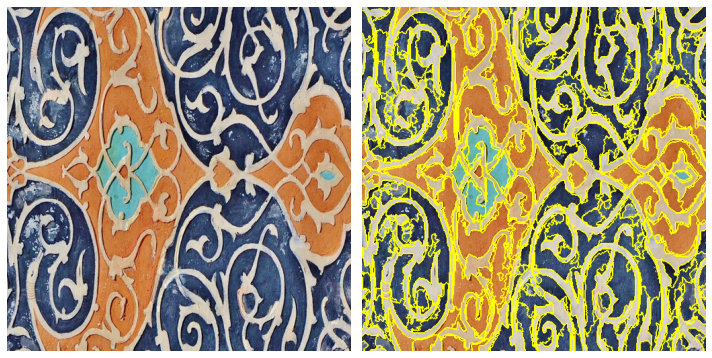

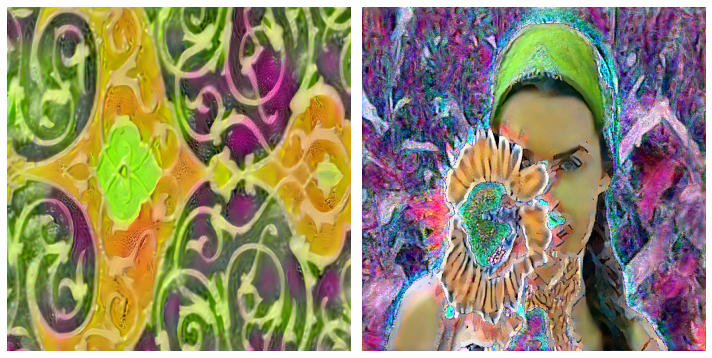

Style segmenting ......
Content segmenting ......
Training ......
Method: 0, style: 1, content: 1


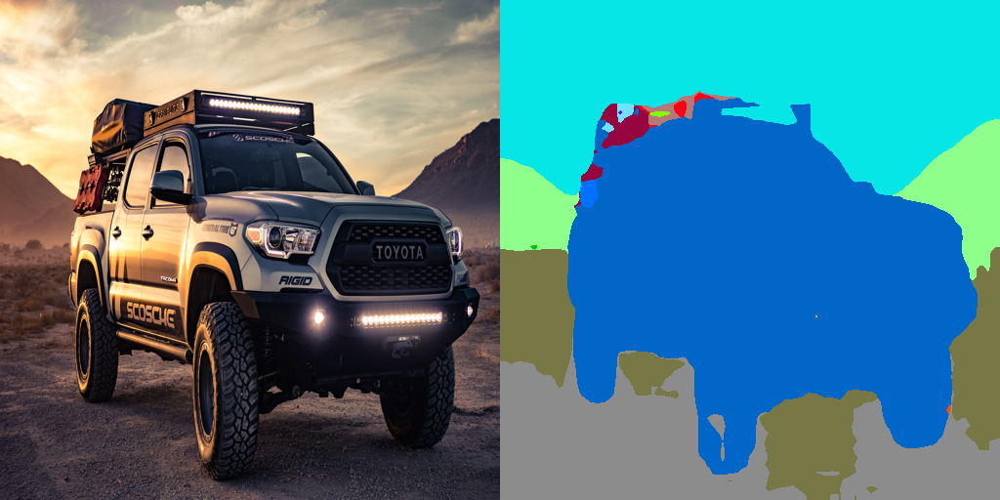

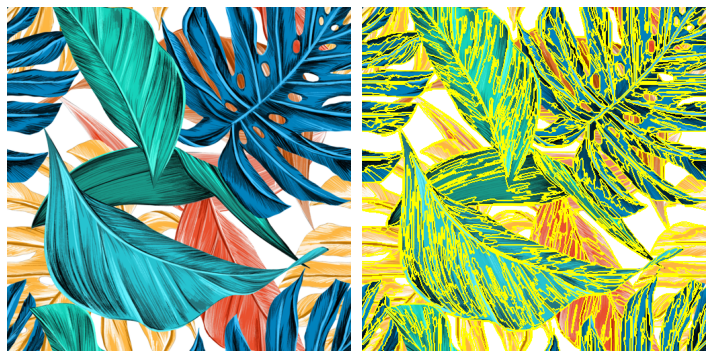

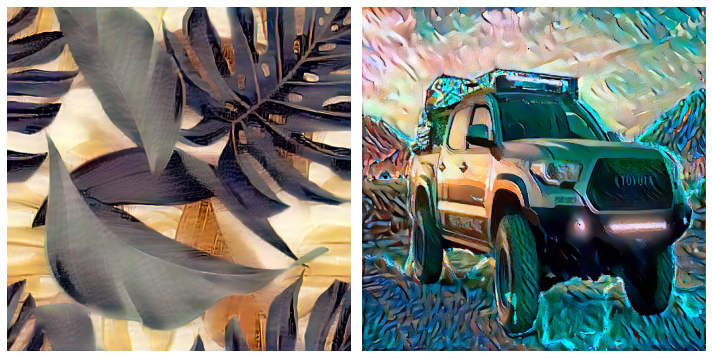

Style segmenting ......
Content segmenting ......
Training ......
Method: 0, style: 2, content: 2


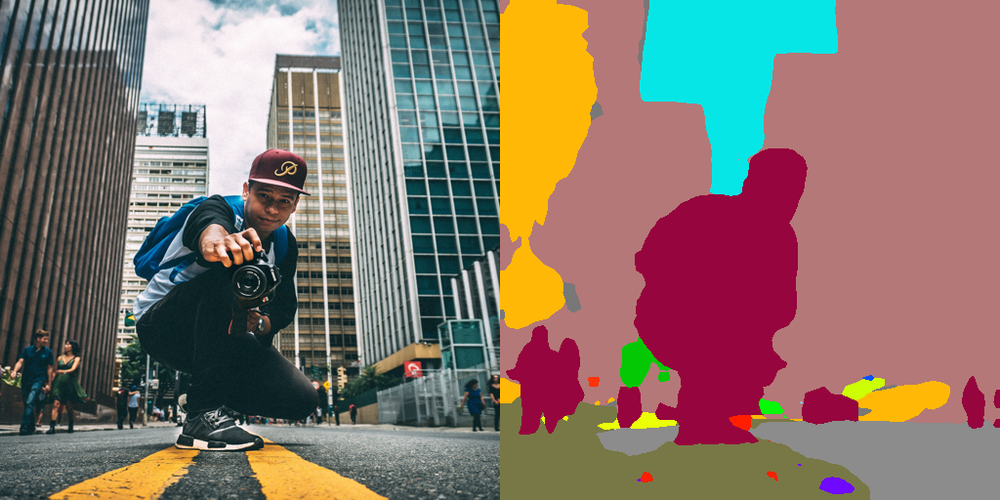

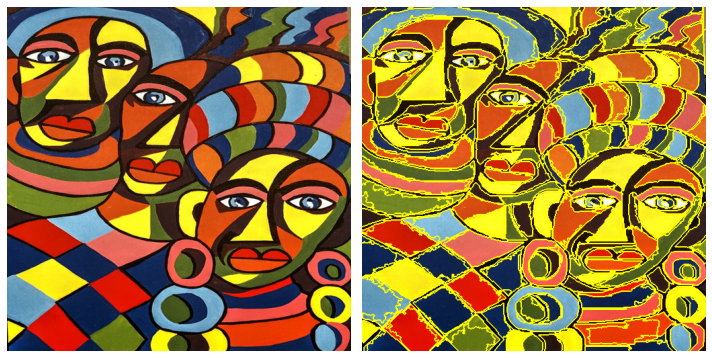

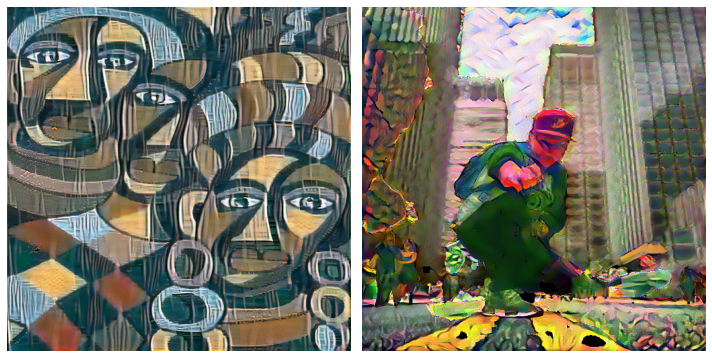

Style segmenting ......
Content segmenting ......
Training ......
Method: 0, style: 3, content: 3


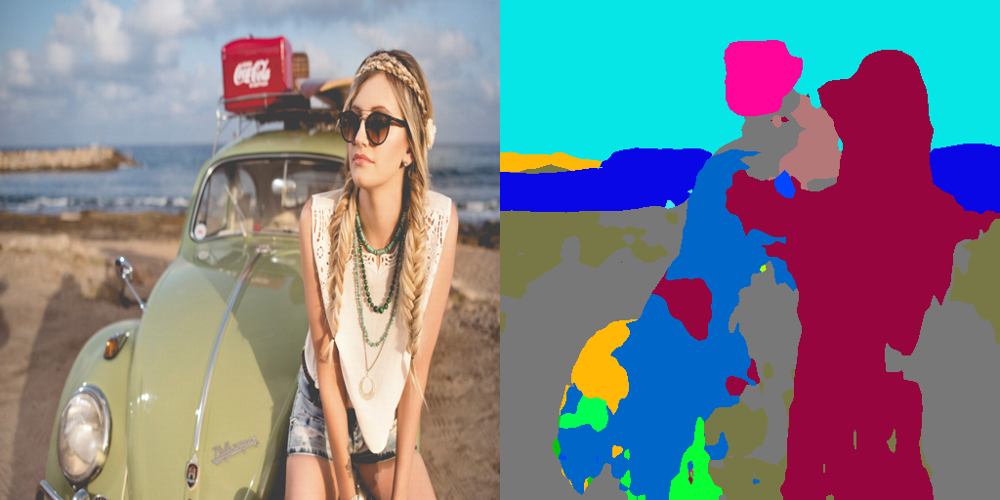

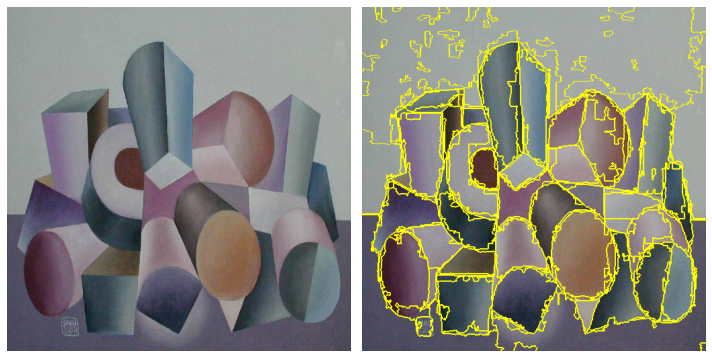

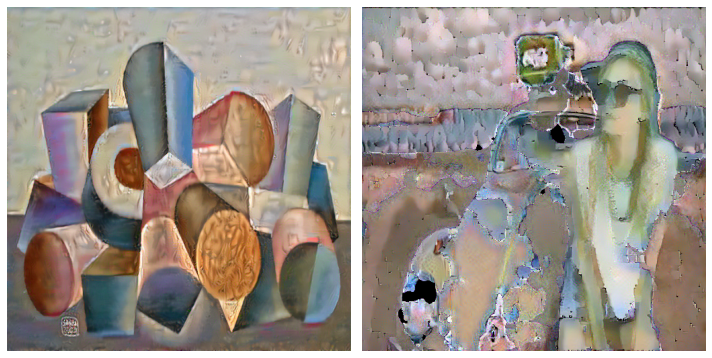

In [174]:
for i in range(0,4):
  for j in range(0,4):
    if i == j: train_total(0, i, j)
    # should: train_total(0, i, j)

## Method 2
**SLIC - K-Means based image segmentation** for style superpixels

To reduce the size of the notebook I will not give the demonstration of all the ST-images for all pairs, but they are similar to the images in the first method

In [ ]:
for i in range(0,4):
  for j in range(0,4):
    train_total(1, i, j)

## Method 3

**Quickshift image segmentation** for style superpixels

To reduce the size of the notebook I will not give the demonstration of all the ST-images for all pairs, but they are similar to the images in the first method

In [ ]:
for i in range(0,4):
  for j in range(0,4):
    train_total(1, i, j)

## Averaging hyperparamater

The hyperparameter **alpha** (which ranges from 0 to 1) controls the level of uniform stylization: close to one means more uniformed stylization.

The basic idea: I use alpha to determine how many segments of style or content are gathered together. If alpha is big, it means less seperate parts of segments will be in the style and content and with less mappings; if alpha is small, means the style and content are segmented more detailed and with more mappings.

I implemented it with 1-st style image and 3-rd content image (boy on the street), as we can see, the style-tranfered image becomes less uniform with the decrease of alpha

alpha: 1
Style segmenting ......
Content segmenting ......
Training ......


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


Method: 0, style: 0, content: 2


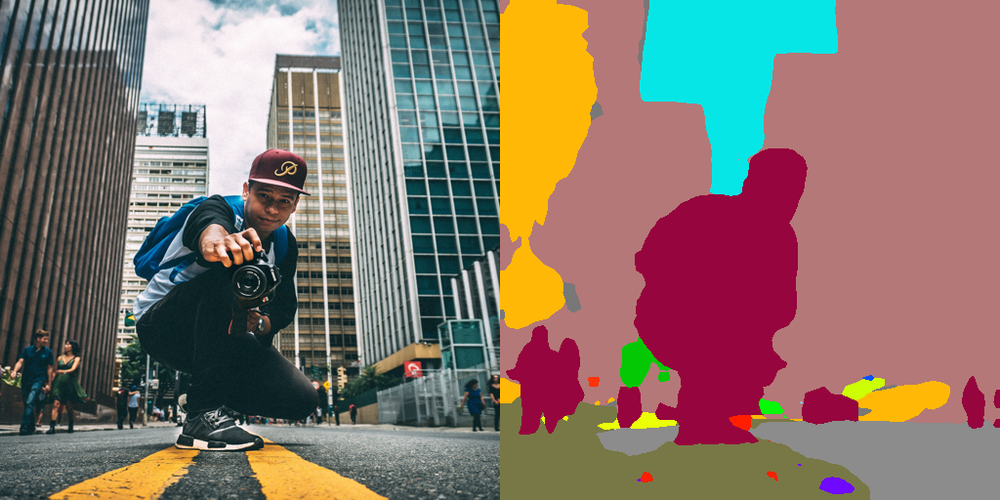

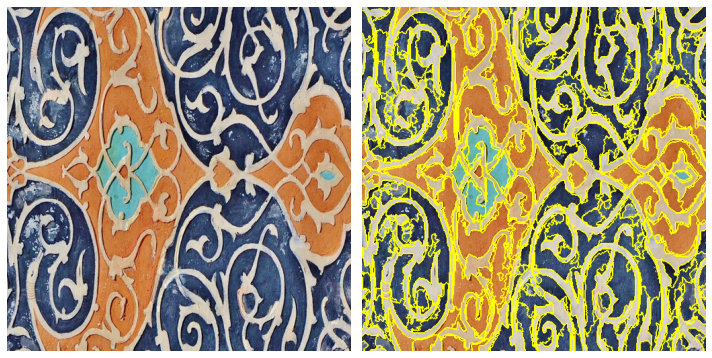

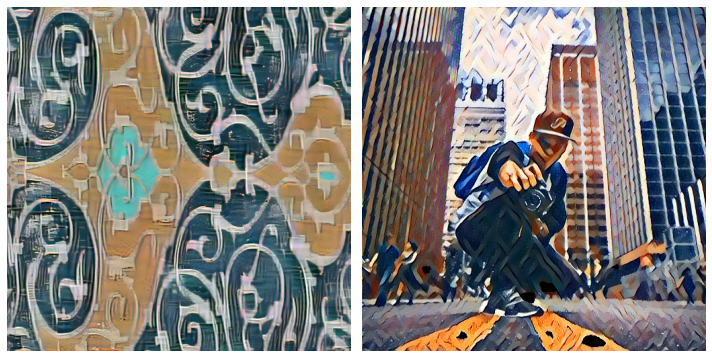

alpha: 0.66
Style segmenting ......
Content segmenting ......
Training ......
Method: 0, style: 0, content: 2


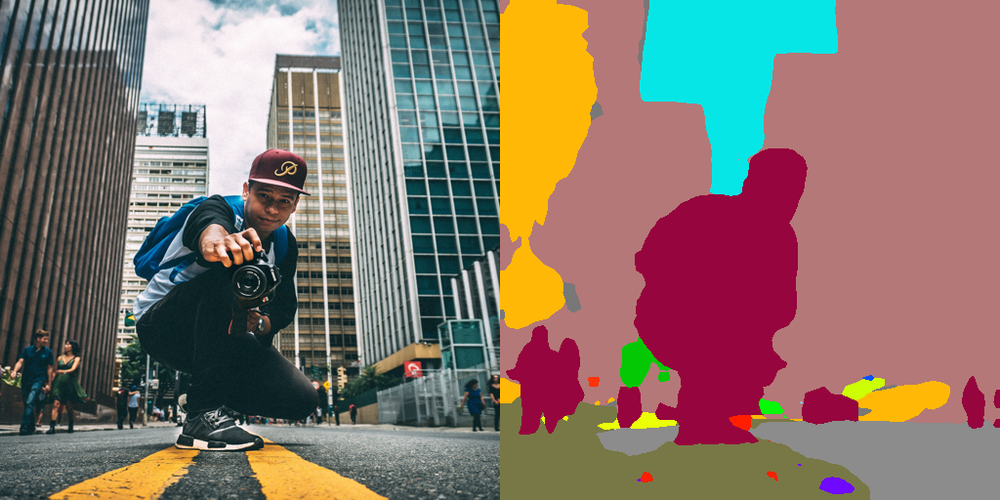

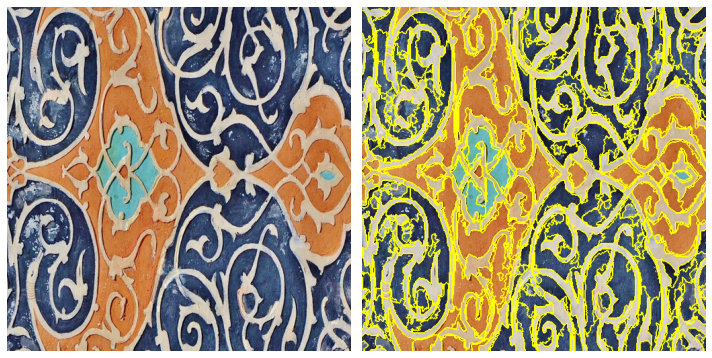

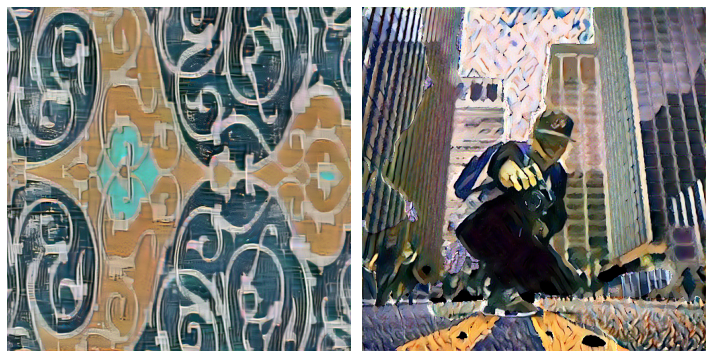

alpha: 0.33
Style segmenting ......
Content segmenting ......
Training ......
Method: 0, style: 0, content: 2


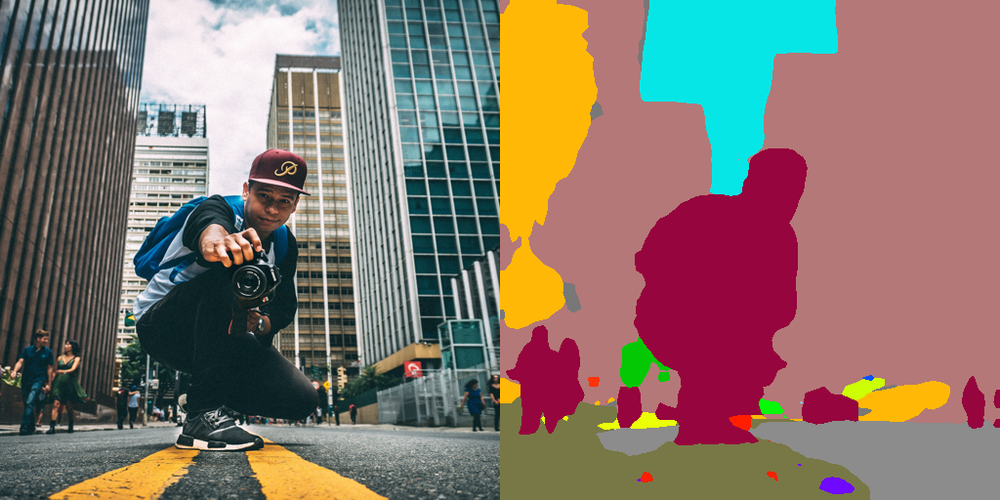

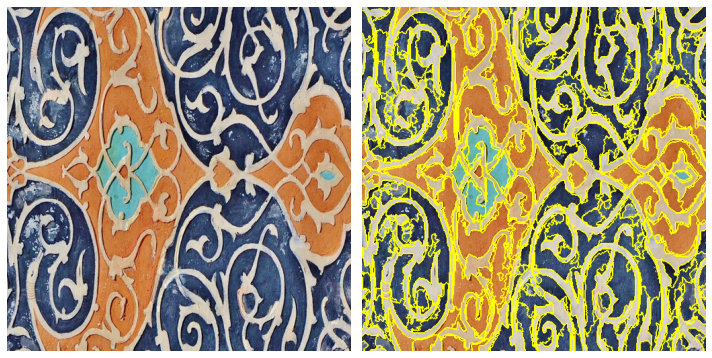

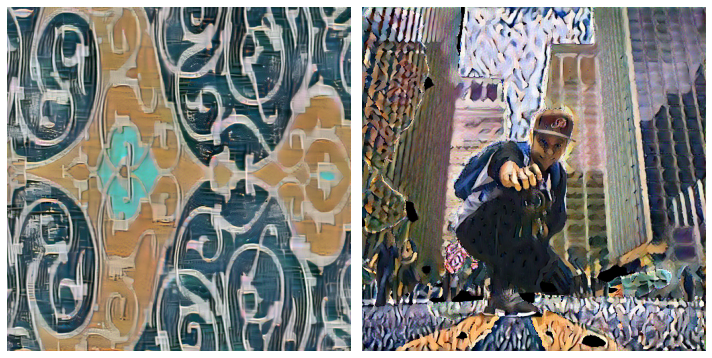

alpha: 0
Style segmenting ......
Content segmenting ......
Training ......
Method: 0, style: 0, content: 2


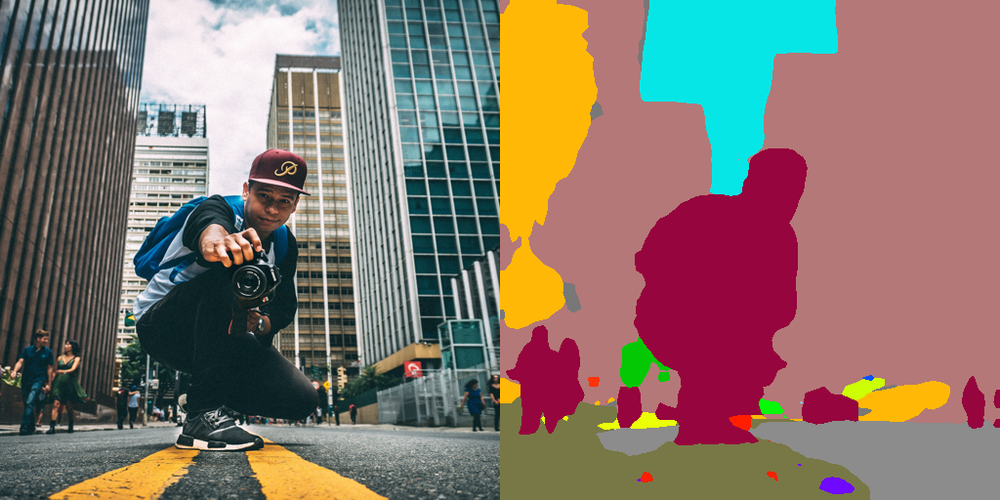

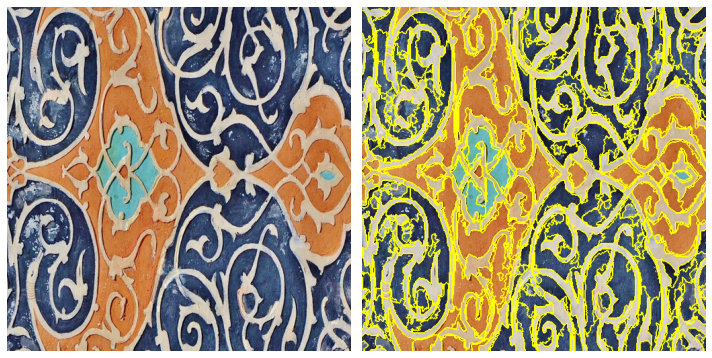

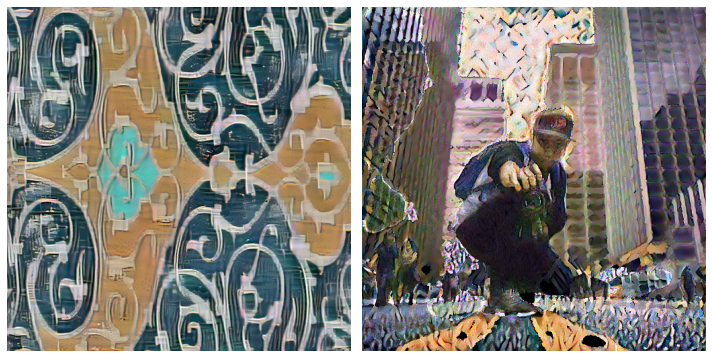

In [173]:
for alpha_value in [1, 0.66, 0.33, 0]:
  alpha = 1 - alpha_value # value from 0 to 1

  MAX_NUM_SEGMENTS = 10
  MIN_NUM_SEGMENTS = 1
  CURRENT_NUM_SEGMENTS = int(1 + alpha* (MAX_NUM_SEGMENTS - MIN_NUM_SEGMENTS))

  print(f'alpha: {alpha_value}')
  train_total(0, 0, 2)

# THE END